In [90]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy.stats as stats


plt.rcParams["figure.figsize"] = (10, 6) 
import warnings
warnings.filterwarnings('ignore') 

# Read Data

In [91]:
df = pd.read_csv("co2.csv")
df

,Make,Model,Vehicle Class,Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
0,ACURA,ILX,COMPACT,2.0,4,AS5,Z,9.9,6.7,8.5,33,196
1,ACURA,ILX,COMPACT,2.4,4,M6,Z,11.2,7.7,9.6,29,221
2,ACURA,ILX HYBRID,COMPACT,1.5,4,AV7,Z,6.0,5.8,5.9,48,136
3,ACURA,MDX 4WD,SUV - SMALL,3.5,6,AS6,Z,12.7,9.1,11.1,25,255
4,ACURA,RDX AWD,SUV - SMALL,3.5,6,AS6,Z,12.1,8.7,10.6,27,244
...,...,...,...,...,...,...,...,...,...,...,...,...
7380,VOLVO,XC40 T5 AWD,SUV - SMALL,2.0,4,AS8,Z,10.7,7.7,9.4,30,219
7381,VOLVO,XC60 T5 AWD,SUV - SMALL,2.0,4,AS8,Z,11.2,8.3,9.9,29,232
7382,VOLVO,XC60 T6 AWD,SUV - SMALL,2.0,4,AS8,Z,11.7,8.6,10.3,27,240
7383,VOLVO,XC90 T5 AWD,SUV - STANDARD,2.0,4,AS8,Z,11.2,8.3,9.9,29,232


In [92]:
df.shape

(7385, 12)

In [93]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7385 entries, 0 to 7384
Data columns (total 12 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Make                              7385 non-null   object 
 1   Model                             7385 non-null   object 
 2   Vehicle Class                     7385 non-null   object 
 3   Engine Size(L)                    7385 non-null   float64
 4   Cylinders                         7385 non-null   int64  
 5   Transmission                      7385 non-null   object 
 6   Fuel Type                         7385 non-null   object 
 7   Fuel Consumption City (L/100 km)  7385 non-null   float64
 8   Fuel Consumption Hwy (L/100 km)   7385 non-null   float64
 9   Fuel Consumption Comb (L/100 km)  7385 non-null   float64
 10  Fuel Consumption Comb (mpg)       7385 non-null   int64  
 11  CO2 Emissions(g/km)               7385 non-null   int64  
dtypes: flo

In [94]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Engine Size(L),7385.0,3.160068,1.354170,0.9,2.0,3.0,3.7,8.4
Cylinders,7385.0,5.615030,1.828307,3.0,4.0,6.0,6.0,16.0
Fuel Consumption City (L/100 km),7385.0,12.556534,3.500274,4.2,10.1,12.1,14.6,30.6
Fuel Consumption Hwy (L/100 km),7385.0,9.041706,2.224456,4.0,7.5,8.7,10.2,20.6
Fuel Consumption Comb (L/100 km),7385.0,10.975071,2.892506,4.1,8.9,10.6,12.6,26.1
Fuel Consumption Comb (mpg),7385.0,27.481652,7.231879,11.0,22.0,27.0,32.0,69.0
CO2 Emissions(g/km),7385.0,250.584699,58.512679,96.0,208.0,246.0,288.0,522.0


In [95]:
df.isnull().sum()

Make                                0
Model                               0
Vehicle Class                       0
Engine Size(L)                      0
Cylinders                           0
Transmission                        0
Fuel Type                           0
Fuel Consumption City (L/100 km)    0
Fuel Consumption Hwy (L/100 km)     0
Fuel Consumption Comb (L/100 km)    0
Fuel Consumption Comb (mpg)         0
CO2 Emissions(g/km)                 0
dtype: int64

In [96]:
from ydata_profiling import ProfileReport
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

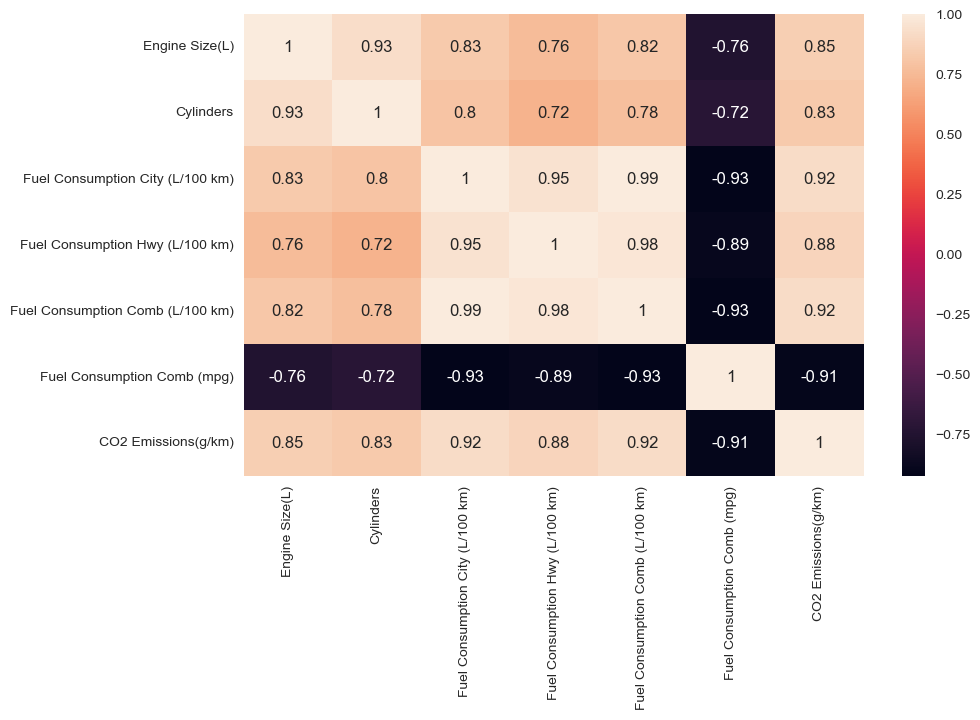

In [97]:
sns.heatmap(df.corr(numeric_only=True), annot=True);

In [98]:
def color_red_val(val):
    if val > 0.90 and val < 0.99:
        color = 'red'
    elif val >= 1:
        color = 'blue'
    else:
        color = 'white'
    return f' color:{color}'

In [99]:
pd.DataFrame(df).corr(numeric_only = True).style.applymap(color_red_val)

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
Engine Size(L),1.000000,0.927653,0.831379,0.761526,0.817060,-0.757854,0.851145
Cylinders,0.927653,1.000000,0.800702,0.715252,0.780534,-0.719321,0.832644
Fuel Consumption City (L/100 km),0.831379,0.800702,1.000000,0.948180,0.993810,-0.927059,0.919592
Fuel Consumption Hwy (L/100 km),0.761526,0.715252,0.948180,1.000000,0.977299,-0.890638,0.883536
Fuel Consumption Comb (L/100 km),0.817060,0.780534,0.993810,0.977299,1.000000,-0.925576,0.918052
Fuel Consumption Comb (mpg),-0.757854,-0.719321,-0.927059,-0.890638,-0.925576,1.000000,-0.907426
CO2 Emissions(g/km),0.851145,0.832644,0.919592,0.883536,0.918052,-0.907426,1.000000


# Simple Linear Regression

In [100]:
df1 = df[["Engine Size(L)", "CO2 Emissions(g/km)"]]
df1.head()

,Engine Size(L),CO2 Emissions(g/km)
0,2.0,196
1,2.4,221
2,1.5,136
3,3.5,255
4,3.5,244


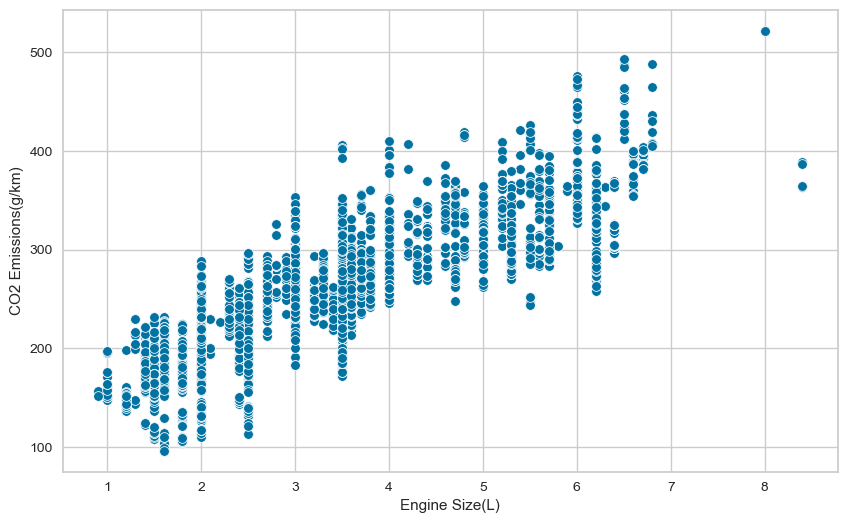

In [101]:
sns.scatterplot(data=df1, x="Engine Size(L)", y="CO2 Emissions(g/km)");

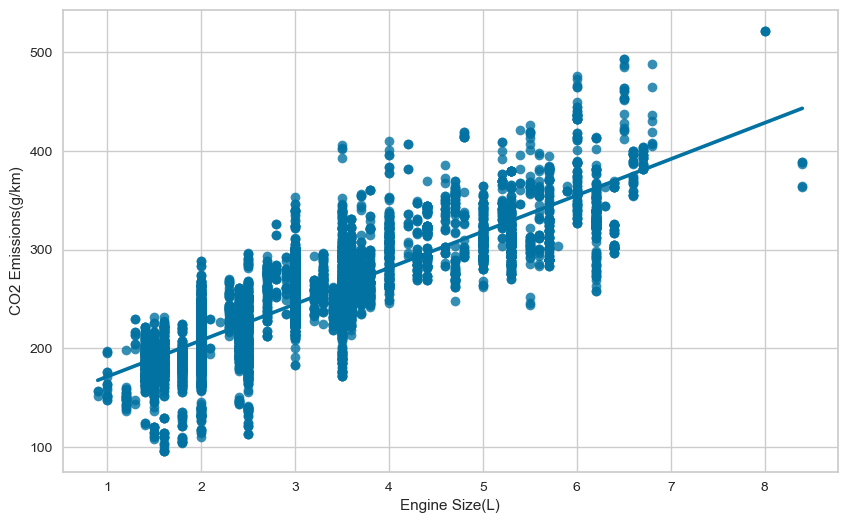

In [102]:
sns.regplot(x="Engine Size(L)", y="CO2 Emissions(g/km)", data=df1, ci=None);

In [103]:
slope, intercept = np.polyfit(X, y, deg=1)

print("slope       :", slope)
print("intercept   :", intercept)

TypeError: expected 1D vector for x

In [ ]:
corr = df["CO2 Emissions(g/km)"].corr(df["Engine Size(L)"])
corr

In [ ]:
R2_score = corr**2
R2_score

In [ ]:
X = df["Engine Size(L)"]
y = df["CO2 Emissions(g/km)"]

In [ ]:
np.polyfit(X, y, deg=1)

In [ ]:
slope, intercept = np.polyfit(X, y, deg=1)

print("slope       :", slope)
print("intercept   :", intercept)

In [ ]:
b1, b0 = np.polyfit(X, y, deg=1)

print("b1 :", b1)
print("b0 :", b0)

In [ ]:
y_pred = b1*X + b0
y_pred

In [ ]:
values = {"actual": y, "predicted": y_pred, "residual": y - y_pred, "LSE": (y - y_pred)**2}
df_2 = pd.DataFrame(values)
df_2

In [ ]:
df_2.residual.sum().round()

In [ ]:
df_2.LSE.sum()

In [ ]:
potential_engine = np.linspace(0,10,11)
potential_engine

In [ ]:
predicted_co2_lin = b1*potential_engine + b0
predicted_co2_lin

In [ ]:
plt.plot(potential_engine, predicted_co2_lin)

plt.title("Predicted CO2 & Potential Engine")
plt.xlabel("Potential Engine")
plt.ylabel("Predicted CO2")
plt.show()

In [ ]:
plt.plot(potential_engine, predicted_co2_lin)
sns.scatterplot(x="Engine Size(L)", y="CO2 Emissions(g/km)", data=df);

In [ ]:
a = np.polyfit(X, y, deg=3)
a

In [ ]:
a1 = np.polyfit(X, y, deg=3)[0]
a2 = np.polyfit(X, y, deg=3)[1]
a3 = np.polyfit(X, y, deg=3)[2]
a0 = np.polyfit(X, y, deg=3)[3]

In [ ]:
predicted_co2_poly = a1*potential_engine**3 + a2*potential_engine**2 + a3*potential_engine + a0
predicted_co2_poly 

In [ ]:
plt.plot(potential_engine, predicted_co2_poly, color="red")

plt.title("Predicted CO2 & Potential Engine")
plt.xlabel("Potential Engine")
plt.ylabel("Predicted CO2")
plt.show()

In [ ]:
plt.plot(potential_engine, predicted_co2_poly, color="red")
sns.scatterplot(x="Engine Size(L)", y="CO2 Emissions(g/km)", data=df);

In [ ]:
plt.plot(potential_engine, predicted_co2_poly, color="red")
plt.plot(potential_engine, predicted_co2_lin, color="blue")
sns.scatterplot(x="Engine Size(L)", y="CO2 Emissions(g/km)", data=df);

In [ ]:
R2_score

In [ ]:
s = np.polyfit(X, y, deg=10)
s

In [ ]:
s1 = np.polyfit(X, y, deg=10)[0]
s2 = np.polyfit(X, y, deg=10)[1]
s3 = np.polyfit(X, y, deg=10)[2]
s4 = np.polyfit(X, y, deg=10)[3]
s5 = np.polyfit(X, y, deg=10)[4]
s6 = np.polyfit(X, y, deg=10)[5]
s7 = np.polyfit(X, y, deg=10)[6]
s8 = np.polyfit(X, y, deg=10)[7]
s9 = np.polyfit(X, y, deg=10)[8]
s10 = np.polyfit(X, y, deg=10)[9]
s0 = np.polyfit(X, y, deg=10)[10]

In [ ]:
pred_lin = b1*X + b0
predicted_co2_poly = s1*X**10 + s2*X**9 + s3*X**8 + s4*X**7 + s5*X**6 + s6*X**5 + s7*X**4 + s8*X**3 + s9*X**2 + s10*X + s0
predicted_co2_poly 

In [ ]:
values = {"actual": y, "predicted": predicted_co2_poly, "residual": y - predicted_co2_poly, "LSE": (y - predicted_co2_poly)**2}
df_2 = pd.DataFrame(values)
df_2

In [ ]:
corr2 = df["CO2 Emissions(g/km)"].corr(predicted_co2_poly)
corr2

In [ ]:
R2_score2 = corr2**2
R2_score2

# Multiple Linear Regression

In [ ]:
df.columns

In [ ]:
X = df[['Engine Size(L)', 'Fuel Consumption Comb (L/100 km)', 'Fuel Consumption Hwy (L/100 km)', 'Fuel Consumption City (L/100 km)']]
y = df['CO2 Emissions(g/km)']

# Train | Test Split

In [ ]:
from sklearn.model_selection import train_test_split 

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=42)

In [ ]:
print("X Train features shape: {}\ny Train features shape: {}\nX Test features shape : {}\nY Test features shape : {}".format
      (X_train.shape, y_train.shape, X_test.shape, y_test.shape))

## Model Fitting

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
lr = LinearRegression()

In [ ]:
lr.fit(X_train, y_train)

In [ ]:
y_pred = lr.predict(X_test)
y_pred

In [ ]:
lr.feature_names_in_

In [ ]:
lr.coef_

In [ ]:
my_dict = {"Actual": y_test, "Pred": y_pred, "Residual": y_test - y_pred}

In [ ]:
comparing = pd.DataFrame(my_dict)
comparing

In [ ]:
result_sample = comparing.sample(25)
result_sample

In [ ]:
result_sample.plot(kind="bar", figsize=(15,9));

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [ ]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    R2_score = r2_score(actual, pred)
    print("Model testing performance: ")
    print("---------------------------")
    print(f"R2_score \t: {R2_score}")
    print(f"MAE \t\t: {mae}")
    print(f"MSE \t\t: {mse}")
    print(f"RMSE \t\t: {rmse}")

In [ ]:
eval_metric(y_test, y_pred)

In [ ]:
y_train_pred = model.predict(X_train)

In [ ]:
eval_metric(y_train, y_train_pred)

In [ ]:
residuals = y_test - y_pred

In [ ]:
plt.figure(figsize=(10,6))

sns.scatterplot(x=y_test, y=residuals)

plt.xlabel("CO2")
plt.ylabel("Residuals")
plt.axhline(y=0, color="r", linestyle="--");

In [ ]:
sns.kdeplot(residuals);

In [ ]:
stats.probplot(residuals, dist="norm", plot=plt);

In [ ]:
from yellowbrick.regressor import ResidualsPlot

model = LinearRegression()
visualizer = ResidualsPlot(model)

visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test)  
visualizer.show()          

In [ ]:
from yellowbrick.regressor import PredictionError

model = LinearRegression()
visualizer = PredictionError(model)

visualizer.fit(X_train, y_train)  
visualizer.score(X_test, y_test)  
visualizer.show()           